<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Challenge" data-toc-modified-id="Challenge-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Challenge</a></span></li><li><span><a href="#Model-Scoping:-Capturing-a-Step-Input-Response" data-toc-modified-id="Model-Scoping:-Capturing-a-Step-Input-Response-2"><span class="toc-item-num">2&nbsp;&nbsp;</span><em>Model Scoping:</em> Capturing a Step Input Response</a></span><ul class="toc-item"><li><span><a href="#MicroRig-Motor" data-toc-modified-id="MicroRig-Motor-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>MicroRig Motor</a></span></li><li><span><a href="#Measuring-Motor-Position" data-toc-modified-id="Measuring-Motor-Position-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Measuring Motor Position</a></span></li><li><span><a href="#Reading-the-motor-encoder-signal" data-toc-modified-id="Reading-the-motor-encoder-signal-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Reading the motor encoder signal</a></span></li><li><span><a href="#Measuring-motor-speed" data-toc-modified-id="Measuring-motor-speed-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Measuring motor speed</a></span></li><li><span><a href="#Recording-a-Step-Response" data-toc-modified-id="Recording-a-Step-Response-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Recording a Step Response</a></span></li></ul></li><li><span><a href="#Model-Construction:-Select-elements-and-connect-in-a-system-representation" data-toc-modified-id="Model-Construction:-Select-elements-and-connect-in-a-system-representation-3"><span class="toc-item-num">3&nbsp;&nbsp;</span><em>Model Construction:</em> Select elements and connect in a system representation</a></span></li><li><span><a href="#Model-Construction:-Linear-Graph-and-System-Equation" data-toc-modified-id="Model-Construction:-Linear-Graph-and-System-Equation-4"><span class="toc-item-num">4&nbsp;&nbsp;</span><em>Model Construction:</em> Linear Graph and System Equation</a></span></li><li><span><a href="#Model-Construction-and-Validation:-Parameter-Estimation" data-toc-modified-id="Model-Construction-and-Validation:-Parameter-Estimation-5"><span class="toc-item-num">5&nbsp;&nbsp;</span><em>Model Construction and Validation:</em> Parameter Estimation</a></span></li><li><span><a href="#Model-Validation:-Coast-Down" data-toc-modified-id="Model-Validation:-Coast-Down-6"><span class="toc-item-num">6&nbsp;&nbsp;</span><em>Model Validation:</em> Coast Down</a></span></li><li><span><a href="#Model-Construction:-Nonlinear-model" data-toc-modified-id="Model-Construction:-Nonlinear-model-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Model Construction: Nonlinear model</a></span></li></ul></div>

# Challenge

Develop a validated model of the benchtop motor using experimental data that will allow you to predict the output for **any** step input.  Additionally, we need our model to be able to handle physical changes in the system.   For example, what if a "load" is added to the motor?  You will need a physics-based model that can account for these kinds of changes.

#  *Model Scoping:* Capturing a Step Input Response

We'll follow the the [disciplined process from Week 03 Wednesday](../Week03_Wednesday/Week03_Wednesday.ipynb#Model-Scoping-Disciplined-Process:-Lumped-parameter-Dynamic-Physical-Systems) and begin by identifying the inputs and outputs of the system. As you've already seen in your previous labs, the input to the motor is voltage and the output is angular velocity.

In order to scope the order of the differential equation we would use to model the system, we'll need to record the response of the motor's angular velocity to a step input in voltage.  It will require a few steps to develop this experimental capability.

## MicroRig Motor

An exploded view of the Pololu 50:1 gearmotor that will be used for the testing is shown below.  **Find the motor windings, commutator and brushes on the diagram.**

*Consider revisting the material on [DC motors from Lab 1](../Lab_1/Lab_1.ipynb#Model-Development:-DC-Motor)if these terms or concepts are not familiar to you.*

<br>

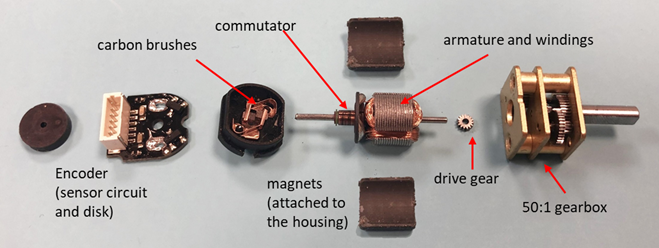

Relevant characteristics of the motor are provided by the [manufacturer.](https://www.pololu.com/product/3073/specs).  **Your motor has a peak current of 1.5 amps (3 times the nomimal output of a typical USB connection) so you'll need to make sure your 5V power supply is connected to the 5V jack labeled in the [hardware resource.](../Week04_Implementation_Resources/Week04_Hardware_Resource.ipynb#ME-480-Portable-Workstation)**


## Measuring Motor Position
In order to measure the speed of the motor we will use the Pololu motor encoder that is attached to the back of the motor. The encoder can be used to measure both the position and speed of the motor. An image of our encoder is shown below. The disk has six embbeded magnetic poles (3 north, 3 south) that can be sensed by the Hall effect sensors attached to the small circuit board. 

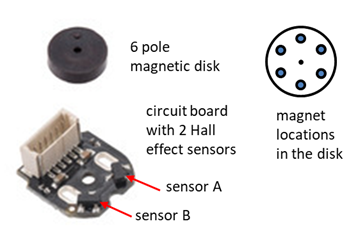

The encoder uses a method called quadrature to let us measure the incremental movement of the disk as well as its direction of rotation. The two Hall effect senors are 75° apart. That makes them 1.25 the distance between the magnets which are 60° apart. The animation below shows a system with more markers (the equivelant to our magnets) but also with sensors 1.25 ticks apart. As shown in the figure, this allows the system to measure position to 1/4 of the tick spacing and to sense the direction or rotation. 

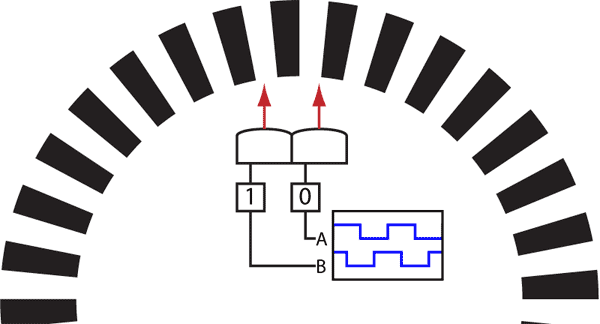


Looking at the graphs below, if channel A transitions to false after channels A and B were both true, the disk is moving clockwise. It channel B transitions to false after channels A and B were both true, the disk is moving counterclockwise. This gives us the relative motion of the disk. If we track the number of transitions, we can measure the position of the motor from its starting point. 

If we measure the time between transistions or we count the number of transitions over a fixed time, we can determine the speed of the motor. The hall-effect sensors and magnetic poles on the disk are arranged such that each sensor can measure 3 N-S or S-N transitions per revolution of the disk. This means that with a 51.45:1 gear ratio, a 3 pole-pair disk and quadrature we can measure to 1/3 x 1/4 x 1/51.45 of a rotation of the output shaft (0.00162 rotation or 0.6°).

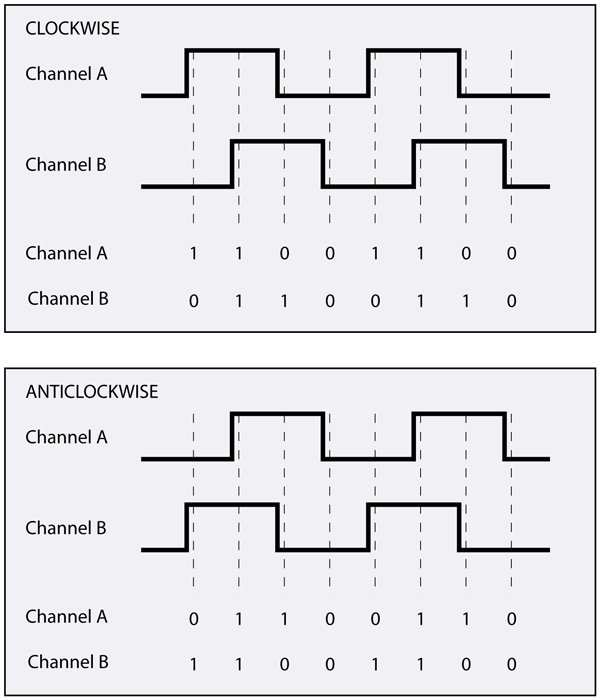
<font size = 2>http://www.creative-robotics.com</font>

## Reading the motor encoder signal

The encoder is already connected to your arduino through the motor cable. You can find the signals for the Motor2 connector on your [Workstations pinout diagram](../Week04_Implementation_Resources/Week04_Hardware_Resource.ipynb#Arduino-Mega-Pin-Mapping-for-ME480-Workstation).  The code below will read the encoder channel A and channel B, determine the direction of rotation and update an ```encoderCount``` variable with the total transition counts. 

***Review the code and comments below and paste the relevant sections into the appropriate parts of a new Arduino program***

```c

// The encoder count will be updated outside the normal loop operation and therefore
// needs to be accessed quickly and accurately.  To do this, a variable is declared "volatile" 
// so it is put into ram where it can be accessed very quickly.
volatile long encoderCountShared; //long is used to allow more counts of the encoder to be stored

int encoderChAPin = 20;
int encoderChBPin = 21;


void setup() {
  //an "interrupt" is a function that runs AT ANY TIME during the program's operation.  It is named this because
  //it literally interrupts the program, and takes over CPU operations until it completes its operation.  These
  //are used to make sure important events are not missed.  In our case this will allow us to sense every change
  //in state of the encoder sensors.

  //attach the interrupt subroutines for each encoder channels to interrupts 0 and 1.  Although it is not obvious 
  //the Arduino documentation reveals that interrupts 0 and 1 scan pins 2 and 3 respectively to 
  //detect when they should run.
  
  //if the voltage on encoderChAPin changes, run the EncoderChA subroutine
  attachInterrupt(digitalPinToInterrupt(encoderChAPin),EncoderChA,CHANGE);
  //if the voltage on encoderChAPin changes, run the EncoderChA subroutine
  attachInterrupt(digitalPinToInterrupt(encoderChBPin),EncoderChB,CHANGE); 
    
  Serial.begin(115200);

}

void loop() {
    
 //In order to read the "volatile" memory, we need to turn off the interupts for 
 //just long enough to get the data out of memory.  This requirement limits the maximum 
  noInterrupts();
  long encoderCount = encoderCountShared;
  interrupts();
  Serial.print("Encoder Count: ");
  Serial.print(encoderCount);
  Serial.println();
}
```

***Create a tab (down arrow in the upper right of the Arduino program) called Quadrature. Paste the following code into the tab.  This contains the functions that will determine the direction of rotation based on the Channel A and B encoder signal and then update the total number of encoder counts***

```c
/*
//Quadrature encoder interrupts

//include in the declarations portion of the main program +++++++++++++++++++

volatile long encoderCountShared;

int encoderChAPin = 20;   //Channel A pin for the encoder
int encoderChBPin = 21;   //Channel B pin for the encoder

//include in the setup portion of the main program ++++++++++++++++++++++++++
  //attach interrupts
  //assigns interrupts to the encoder functions. Triggered when the pin changes
  attachInterrupt(digitalPinToInterrupt(encoderChAPin),EncoderChA,CHANGE);
  attachInterrupt(digitalPinToInterrupt(encoderChBPin),EncoderChB,CHANGE);

//include in the loop portion of the main program +++++++++++++++++++++++++++
  //process encoder values puts the encoder count in encoderUnCount
  noInterrupts();  //stop the interrupt system so the value doesn't change mid interrupt
  long encoderCount = encoderCountShared; //save the count value to a local variable
  interrupts();    //restart the interrupt system

*/

//Copy into a seperate tab from the main program
void EncoderChA(){
  //Serial.println("A");
  if (digitalRead(encoderChAPin) == HIGH){
    if (digitalRead(encoderChBPin) == LOW){
      encoderCountShared++;
    }
    else {
      encoderCountShared--;
    }
  }
  else {
    if (digitalRead(encoderChBPin) == HIGH){
      encoderCountShared++;
    }
    else {
      encoderCountShared--;
    }
  }
}

void EncoderChB(){
  //Serial.println("B");
  if (digitalRead(encoderChBPin) == HIGH){
    if (digitalRead(encoderChAPin) == HIGH){
      encoderCountShared++;
    }
    else {
      encoderCountShared--;
    }
  }
  else {
    if (digitalRead(encoderChAPin) == LOW){
      encoderCountShared++;
    }
    else {
      encoderCountShared--;
    }
  }
}
```
Note that the commented block of code is included so you could easily incorporate the encoder routines into other programs by simply putting the resulting Quadrature.ino into a tab for another program and then copying the associated commented code to the main program.

***Run the program, and with the motor unpowered, rotate the encoder disk at the end of the motor gently by hand and see the change in the counter value in the serial monitor. How many counts (approximately) for a complete revolution of the motor output shaft?  Enter your answer below. Does it match your expectation?***


It takes approximately 600 counts for a complete revolution of the motor output shaft. This matches my expectation as there are 6 magnet locations and two encoder pins (channels A and B) that are updating each time a magnet is encountered, thus for one revolution of the magnet disk, the count is 12. Then multiplied by the gear ratio of 50, we get 600, which corresponds the the 600 counts for a complete revolution of the motor shaft. 

## Measuring motor speed

Now it's time to run your motor and measure its speed.  **Confirm your motor is configured as in Lab 3 so it is disconnected to the inertia module.**  

***Make a copy of your safety system code from Lab 3 and add the encoder code above.  Modify the code to calculate the angular position of the motor shaft in radians.**

Now add a calculation of the the speed of motor output shaft coming out of the gearbox in radians per second for every time step through the loop using the angular position and the micros() function to calculate the elapsed time between measurements.  

***Run the code with the motor running at maximum speed and display the speed in the serial monitor.  Confirm the speed is reasonable by making a visual estimation of the angular velocity of the motor.***

What is the maximum speed of the motor in rad/sec? How many encoder counts do you measure during one loop of the program?

Copy the table into the cell below to provide your answer

|     Parameter            |  Value |
|:------------------------:|:------:|
| encoder counts per loop  |        |
| max speed (rad/s)        |        |

|     Parameter            |  Value |
|:------------------------:|:------:|
| encoder counts per loop  |   14   |
| max speed (rad/s)        | -24.010|

***Place a copy of your Arduino code in the cell below. You do not have to include the code from the Quadrature tab. Format the cell with tickmarks so the code displays correctly.***

```javascript
//SSR_SWITCH represents the Stop/Safe/Ready switch connected to pin 23
//SHIELD_LIMIT represents the limit switch pressed when the safety shield is down connected to pin 5
//R1 represents the RUN1 BUT1ton connected to pin 25
//R2 represents the RUN1 BUT1ton connected to pin 25
//E_STOP represents the emergency stop BUT1ton connected to pin 4
//RWG_LED represents the ready/warning green LED connected to pin 41
//RWR_LED represents the ready/warning green LED connected to pin 39
//RFB_LED represents the run/fault blue LED connected to pin 43
//RFR_LED represents the run/fault red LED connected to pin 45
//MOTOR2_A represents motor 2 direction A connected to pin 6
//MOTOR2_B represents motor 2 direction B connected to pin 7
//MOTOR2_PWM represents motor 2 PWM connected to pin 8
//RELAY represents the motor relay connected to pin 37
//encoderChAPin represents the channel A pin for the encoder
//encoderChBPin represents the channel B pin for the encoder

//SWITCH represents the Stop/Safe/Ready switch reading (0 when in the ready position and 1 when in the safe/stop position)
//SHIELD represents the shield limit switch reading (0 when pressed and 1 when not pressed)
//RUN1 represents the RUN1 BUT1ton reading (0 when pressed and 1 when not pressed)
//RUN2 represents the RUN1 BUT1ton reading (0 when pressed and 1 when not pressed)
//ESTOP represents the emergency stop BUT1ton reading (0 when pressed and 1 when not pressed)

//SAFE represents the safe state
//FAULT represents the fault state
//READY represents the ready state
//WARNING represents the warning state
//RUNNING represents the running state

//safeToReady represents the transition from the safe to ready state
//readyToWarning represents the transition from the ready to the warning state
//warningLatch represents the latch on the warning state
//warningToRunning represents the transition from the warning to the running state
//warningToReady represents the transition from the warning to the ready state
//safeToFault represents the transition from the safe to the fault state
//readyToFault represents the transition from the ready to the fault state
//warningToFault represents the transition from the warning to the fault state
//runningToFault represents the transition from the running to the fault state
//faultToSafe represents the transition from the fault to the safe state
//readyToSafe represents the transition from the ready to the safe state
//warningToSafe represents the transition from the warning to the safe state
//runningToSafe represents the transition from the running to the safe state
//safeLatch represents the latch on the safe state
//faultLatch represents the latch on the fault state
//readyLatch represents the latch on the ready state
//runningLatch represents the latch on the running state

//TMR1 represents the timer and will return true if the time duration is exceeded
//SWITCH_OLD represents the last state of the stop/safe/ready switch
//ledState represents the state of the LED
//previousMillis represents the last time LED was updated
//interval represents the interval at which to blink the LED (milliseconds)
//encoderCountShared represents the encoder count from both channels A and B
//motorPosition represents the motor's position in radians
//pastPosition represents the motor's past position in radians
//motorSpeed represents the motors speed in radians/second
//pastTime represents the previously recorded time
//timeElapsed represents the time elapsed between motor position measurements

#include <LiquidCrystal.h> //include LCD library

//initializing input and output pins
const int SSR_SWITCH = 23;
const int SHIELD_LIMIT = 5;
const int R1 = 25;
const int R2 = 27;
const int E_STOP = 4;
const int RWG_LED = 41;
const int RWR_LED = 39;
const int RFB_LED = 43;
const int RFR_LED = 45;
const int MOTOR2_A = 6;
const int MOTOR2_B = 7;
const int MOTOR2_PWM = 8;
const int RELAY = 37;

// Pin numbers for LDC display
int lcd_rs_pin = 14;
int lcd_en_pin = 15;
int lcd_db4_pin = 16;
int lcd_db5_pin = 17;
int lcd_db6_pin = 18;
int lcd_db7_pin = 19;

//initializing states
bool SAFE = false;
bool FAULT = true;
bool READY = false;
bool WARNING = false;
bool RUNNING = false;

// initializing transitions
bool safeToReady = false;
bool readyToWarning = false;
bool warningLatch = false;
bool warningToRunning = false;
bool warningToReady = false;
bool safeToFault = false;
bool readyToFault = false;
bool warningToFault = false;
bool runningToFault = false;
bool faultToSafe = false;
bool readyToSafe = false;
bool warningToSafe = false;
bool runningToSafe = false;
bool safeLatch = false;
bool faultLatch = false;
bool readyLatch = false;
bool runningLatch = false;

// initializing miscellaneous variables
bool TMR1 = false;
bool SWITCH_OLD = true;
int ledState = LOW;
unsigned long previousMillis = 0;
const long interval = 250;
volatile long encoderCountShared;
float motorPosition;
float pastPosition;
float motorSpeed;
unsigned long pastTime = 0;
float timeElapsed = 0;

int encoderChAPin = 20;   
int encoderChBPin = 21;   

LiquidCrystal LCD(lcd_rs_pin, lcd_en_pin, lcd_db4_pin, lcd_db5_pin, lcd_db6_pin, lcd_db7_pin);

void setup() {
  LCD.begin(8, 2); // initialize LCD
  Serial.begin(115200);
  pinMode(SSR_SWITCH, INPUT);
  pinMode(SHIELD_LIMIT, INPUT_PULLUP);
  pinMode(R1, INPUT_PULLUP);
  pinMode(R2, INPUT_PULLUP);
  pinMode(E_STOP, INPUT_PULLUP);
  pinMode(RWG_LED, OUTPUT);
  pinMode(RWR_LED, OUTPUT);
  pinMode(RFB_LED, OUTPUT);
  pinMode(RFR_LED, OUTPUT);
  pinMode(RELAY, OUTPUT);

  //encoder
  attachInterrupt(digitalPinToInterrupt(encoderChAPin), EncoderChA, CHANGE);
  attachInterrupt(digitalPinToInterrupt(encoderChBPin), EncoderChB, CHANGE);
}

void loop() {
  //encoder
  noInterrupts();  //stop the interrupt system so the value doesn't change mid interrupt
  long encoderCount = encoderCountShared; //save the count value to a local variable
  interrupts();    //restart the interrupt system

  unsigned long currentMillis = millis(); //defining current time in milliseconds
  unsigned long currentTime = micros(); // defining current time in microseconds

  // BLOCK 1: Process Inputs
  //----------------------------------------
  int SWITCH = digitalRead(SSR_SWITCH);
  int SHIELD = !digitalRead(SHIELD_LIMIT); //negating so that this variable is 1 when pressed
  int RUN1 = !digitalRead(R1); //negating so that this variable is 1 when pressed
  int RUN2 = !digitalRead(R2); //negating so that this variable is 1 when pressed
  int ESTOP = !digitalRead(E_STOP); //negating so that this variable is 1 when pressed
  

  //call timer
  TMR1 = Timer(RUN1 && RUN2, 2000);

  // BLOCK 2: State Transition Logic
  //----------------------------------------
  safeToReady = SAFE && !SWITCH;
  readyToWarning = READY && RUN1 && RUN2;
  warningLatch = WARNING && !TMR1 && RUN1 && RUN2 && !SWITCH && !ESTOP && SHIELD;
  warningToRunning = WARNING && TMR1 && RUN1 && RUN2;
  warningToReady = WARNING && !TMR1 && !RUN1 || WARNING && !TMR1 && !RUN2;
  safeToFault = SAFE && ESTOP || SAFE && !SHIELD;
  readyToFault = READY && ESTOP || READY && !SHIELD;
  warningToFault = WARNING && ESTOP || WARNING && !SHIELD;
  runningToFault = RUNNING && ESTOP || RUNNING && !SHIELD;
  faultToSafe = FAULT && !ESTOP && SHIELD && SWITCH && !SWITCH_OLD;
  readyToSafe = READY && SWITCH && !ESTOP && SHIELD;
  warningToSafe = WARNING && SWITCH && !ESTOP && SHIELD;
  runningToSafe = RUNNING && SWITCH && !ESTOP && SHIELD;
  safeLatch = SAFE && SWITCH && !ESTOP && SHIELD;
  faultLatch = FAULT && ESTOP || FAULT && !SHIELD || FAULT && !SWITCH || FAULT && SWITCH_OLD;
  readyLatch = READY && !RUN1 && !ESTOP && SHIELD && !SWITCH || READY && !RUN2 && !ESTOP && SHIELD && !SWITCH;
  runningLatch = RUNNING && !ESTOP && SHIELD && !SWITCH;

  // BLOCK 3: Update States
  //----------------------------------------
  SAFE = faultToSafe || readyToSafe || warningToSafe || runningToSafe || safeLatch;
  FAULT = safeToFault || readyToFault || warningToFault || runningToFault || faultLatch;
  READY = safeToReady || warningToReady || readyLatch;
  WARNING = readyToWarning || warningLatch;
  RUNNING = warningToRunning || runningLatch;

  // BLOCK 4: Set Outputs and Old Variables
  //----------------------------------------
  motorPosition = encoderCount * (PI / 300);
  timeElapsed = ((currentTime - pastTime) * 1E-6);
  motorSpeed = (motorPosition - pastPosition) / (timeElapsed);

  if (SAFE == 1) {
    //motor disconnected
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //READY/WARNING LED illuminated green
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RWG_LED, HIGH);

    //printing to LCD
    LCD.clear();
    LCD.print("SAFE");
    LCD.setCursor(2, 2);
    LCD.print("DISC");

  }

  if (FAULT == 1) {
    //motor disconnected
    digitalWrite(RELAY, LOW);
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //RUN/FAULT LED flashing red and all other LEDs switched off
    if (currentMillis - previousMillis >= interval) {
      previousMillis = currentMillis;
      if (ledState == LOW) {
        ledState = HIGH;
      } else {
        ledState = LOW;
      }
    }

    digitalWrite(RWG_LED, LOW);
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RFR_LED, ledState);

    // printing to LCD
    LCD.clear();
    LCD.print("FAULT");
    LCD.setCursor(2, 2);
    LCD.print("DISC");
  }

  if (READY == 1) {
    //motor disconnected
    digitalWrite(RELAY, LOW);
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //READY/WARNING LED flashing green and all other LEDs switched off
    if (currentMillis - previousMillis >= interval) {
      previousMillis = currentMillis;
      if (ledState == LOW) {
        ledState = HIGH;
      } else {
        ledState = LOW;
      }
    }
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RWG_LED, ledState);
    
    //printing to LCD
    LCD.clear();
    LCD.print("READY");
    LCD.setCursor(2, 2);
    LCD.print("DISC");
  }

  if (WARNING == 1) {
    //motor disconnected
    digitalWrite(RELAY, LOW);
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //READY/WARNING LED flashing red and all other LEDs switched off
    if (currentMillis - previousMillis >= interval) {
      previousMillis = currentMillis;
      if (ledState == LOW) {
        ledState = HIGH;
      } else {
        ledState = LOW;
      }
    }

    digitalWrite(RWG_LED, LOW);
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RWR_LED, ledState);
    
    //printing to LCD
    LCD.clear();
    LCD.print("WARNING");
    LCD.setCursor(2, 2);
    LCD.print("DISC");
  }

  if (RUNNING == 1) {
    //motor connected
    digitalWrite(RELAY, HIGH);
    digitalWrite(MOTOR2_PWM, HIGH);
    digitalWrite(MOTOR2_A, HIGH);
    digitalWrite(MOTOR2_B, LOW);


    //RUN/FAULT LED illuminated blue
    digitalWrite(RWG_LED, LOW);
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RFB_LED, HIGH);

    //printing to LCD
    LCD.clear();
    LCD.print("RUNNING");
    LCD.setCursor(2, 2);
    LCD.print("CONN");
  }
  
  //checking if RUN1 or RUN2 is pressed and displaying to LCD
  if (RUN1 == 1) {
    LCD.setCursor(1, 2);
    LCD.print("*");
  } else {
    LCD.setCursor(1, 2);
    LCD.print("-");
  }
  if (RUN2 == 1) {
    LCD.setCursor(6, 2);
    LCD.print("*");
  } else {
    LCD.setCursor(6, 2);
    LCD.print("-");
  }
  
  //printing motor speed to serial monitor
  Serial.println(motorSpeed);
  
  // setting "old" variables
  SWITCH_OLD = SWITCH;
  pastTime = currentTime;
  pastPosition = motorPosition;
  
  delay(10);
}
```

## Recording a Step Response

In order to be able to judge a reasonable order for the differential equation that might model your system, you will need to record the response of your system to a step input.  Modify your code to enable the following capabilities:

The safety modes should control the motor relay just the way they did in Lab 3. We will be changing how we use the LCD panel. 

In FAULT mode:
* The LCD panel should be cleared and then print FAULT in the upper line of the panel.

In SAFE mode:
* Read the counts from Potentiometer 1 (POT 1) and convert the counts to a voltage from 0V to 5V. This voltage is the initial voltage that will be sent to the motor. Display the initial voltage on the first line of the LCD: "P1:" *Voltage*.  
* Read the counts from Potentiometer 2 (POT 2) and convert the counts to a voltage from -5V to 5V. This voltage is the amount the voltage to the motor will change when BTN 1 is pressed (step voltage). Display the step voltage on the second line of the LCD: "P2:" *Voltage*.
* As you change the potentiometer, the displayed voltage should also change.
* The values of the initial and step voltages may only be changed in SAFE mode. If you move the potentiometer when you are in any other mode the initial and step voltage values should remain unchanged. 
* You can format the output of a *float* variable by adding the number of significant digits in the print statement after the variable name, i.e. LCD.print(MyVariable, 2). This works for both the LCD and Serial print commands.

In RUN mode
* When you enter RUN mode the motor will be sent an input voltage equal to the inital voltage level.
* When BTN 1 is held down, the motor input voltage will change from the initial voltage to the initial voltage + the step voltage. When BTN 1 is released the motor voltage will return to the initial voltage.
* If the sum of the two voltages is less than 0V or greater than 5V, the motor input voltage will be limited to no less than 0V and no greater than 5V. 
* Use the serial monitor to output 4 columns: current time from micros(), the motor's initial voltage, the motor's current voltage, and the motor's angular velocity, which should be calculated every cycle through the loop.
* As before, if you leave RUN mode the motor should shut down.

LCD Display:
* The LCD display should only be updated in the FAULT or SAFE modes.

***Place a copy of your main Adruino code in the cell below.  You don't have to include your tabs.**

```javascript
//SSR_SWITCH represents the Stop/Safe/Ready switch connected to pin 23
//SHIELD_LIMIT represents the limit switch pressed when the safety shield is down connected to pin 5
//R1 represents the RUN1 BUT1ton connected to pin 25
//R2 represents the RUN1 BUT1ton connected to pin 25
//E_STOP represents the emergency stop BUT1ton connected to pin 4
//RWG_LED represents the ready/warning green LED connected to pin 41
//RWR_LED represents the ready/warning green LED connected to pin 39
//RFB_LED represents the run/fault blue LED connected to pin 43
//RFR_LED represents the run/fault red LED connected to pin 45
//MOTOR2_A represents motor 2 direction A connected to pin 6
//MOTOR2_B represents motor 2 direction B connected to pin 7
//MOTOR2_PWM represents motor 2 PWM connected to pin 8
//RELAY represents the motor relay connected to pin 37
//encoderChAPin represents the channel A pin for the encoder
//encoderChBPin represents the channel B pin for the encoder
//P1 represents potentiometer 1 connected to channel A0
//P2 represents potentiometer 2 connected to channel A1
//BUT1 represents button 1 connected to pin 29
//BUT2 represents button 2 connected to pin 31

//SWITCH represents the Stop/Safe/Ready switch reading (0 when in the ready position and 1 when in the safe/stop position)
//SHIELD represents the shield limit switch reading (0 when pressed and 1 when not pressed)
//RUN1 represents the RUN1 BUT1ton reading (0 when pressed and 1 when not pressed)
//RUN2 represents the RUN1 BUT1ton reading (0 when pressed and 1 when not pressed)
//ESTOP represents the emergency stop button reading (0 when pressed and 1 when not pressed)
//BTN1 represents the button 1 reading (0 when pressed and 1 when not pressed) 
//BTN2 represents the button 2 reading (0 when pressed and 1 when not pressed) 
//POT1 represents the potentiometer 1 reading (0-1020)
//POT2 represents the potentiometer 1 reading (0-1020)

//SAFE represents the safe state
//FAULT represents the fault state
//READY represents the ready state
//WARNING represents the warning state
//RUNNING represents the running state

//safeToReady represents the transition from the safe to ready state
//readyToWarning represents the transition from the ready to the warning state
//warningLatch represents the latch on the warning state
//warningToRunning represents the transition from the warning to the running state
//warningToReady represents the transition from the warning to the ready state
//safeToFault represents the transition from the safe to the fault state
//readyToFault represents the transition from the ready to the fault state
//warningToFault represents the transition from the warning to the fault state
//runningToFault represents the transition from the running to the fault state
//faultToSafe represents the transition from the fault to the safe state
//readyToSafe represents the transition from the ready to the safe state
//warningToSafe represents the transition from the warning to the safe state
//runningToSafe represents the transition from the running to the safe state
//safeLatch represents the latch on the safe state
//faultLatch represents the latch on the fault state
//readyLatch represents the latch on the ready state
//runningLatch represents the latch on the running state

//TMR1 represents the timer and will return true if the time duration is exceeded
//SWITCH_OLD represents the last state of the stop/safe/ready switch
//ledState represents the state of the LED
//previousMillis represents the last time LED was updated
//interval represents the interval at which to blink the LED (milliseconds)
//encoderCountShared represents the encoder count from both channels A and B
//motorPosition represents the motor's position in radians
//pastPosition represents the motor's past position in radians
//motorSpeed represents the motors speed in radians/second
//pastTime represents the previously recorded time
//timeElapsed represents the time elapsed between motor position measurements
//POT1_volt represents the voltage reading converted from counts from potentiometer 1
//POT2_volt represents the voltage reading converted from counts from potentiometer 2
//motor_volt voltage to be supplied to the motor
//motor_count represents the conversion from voltage to counts to be written to the motor

#include <LiquidCrystal.h> //include LCD library

//initializing input and output pins
const int SSR_SWITCH = 23;
const int SHIELD_LIMIT = 5;
const int R1 = 25;
const int R2 = 27;
const int E_STOP = 4;
const int RWG_LED = 41;
const int RWR_LED = 39;
const int RFB_LED = 43;
const int RFR_LED = 45;
const int MOTOR2_A = 6;
const int MOTOR2_B = 7;
const int MOTOR2_PWM = 8;
const int RELAY = 37;
const int P1 = A0;
const int P2 = A1;
const int BUT1 = 29;
const int BUT2 = 31;

// Pin numbers for LDC display
int lcd_rs_pin = 14;
int lcd_en_pin = 15;
int lcd_db4_pin = 16;
int lcd_db5_pin = 17;
int lcd_db6_pin = 18;
int lcd_db7_pin = 19;

//initializing states
bool SAFE = false;
bool FAULT = true;
bool READY = false;
bool WARNING = false;
bool RUNNING = false;

// initializing transitions
bool safeToReady = false;
bool readyToWarning = false;
bool warningLatch = false;
bool warningToRunning = false;
bool warningToReady = false;
bool safeToFault = false;
bool readyToFault = false;
bool warningToFault = false;
bool runningToFault = false;
bool faultToSafe = false;
bool readyToSafe = false;
bool warningToSafe = false;
bool runningToSafe = false;
bool safeLatch = false;
bool faultLatch = false;
bool readyLatch = false;
bool runningLatch = false;

// initializing miscellaneous variables
bool TMR1 = false;
bool SWITCH_OLD = true;
int ledState = LOW;
unsigned long previousMillis = 0;
const long interval = 250;
volatile long encoderCountShared;
float motorPosition;
float pastPosition;
float motorSpeed;
unsigned long pastTime = 0;
float timeElapsed = 0;

float POT1_volt = 0;
float POT2_volt = 0;
float motor_volt = 0;
float motor_count = 0;

int encoderChAPin = 20;   //Channel A pin for the encoder
int encoderChBPin = 21;   //Channel B pin for the encoder

LiquidCrystal LCD(lcd_rs_pin, lcd_en_pin, lcd_db4_pin, lcd_db5_pin, lcd_db6_pin, lcd_db7_pin);

void setup() {
  LCD.begin(8, 2); // initialize LCD
  Serial.begin(115200);
  pinMode(SSR_SWITCH, INPUT);
  pinMode(SHIELD_LIMIT, INPUT_PULLUP);
  pinMode(R1, INPUT_PULLUP);
  pinMode(R2, INPUT_PULLUP);
  pinMode(E_STOP, INPUT_PULLUP);
  pinMode(RWG_LED, OUTPUT);
  pinMode(RWR_LED, OUTPUT);
  pinMode(RFB_LED, OUTPUT);
  pinMode(RFR_LED, OUTPUT);
  pinMode(RELAY, OUTPUT);
  pinMode(P1, INPUT);
  pinMode(P2, INPUT);
  pinMode(BUT1, INPUT_PULLUP);
  pinMode(BUT2, INPUT_PULLUP);

  //encoder
  attachInterrupt(digitalPinToInterrupt(encoderChAPin), EncoderChA, CHANGE);
  attachInterrupt(digitalPinToInterrupt(encoderChBPin), EncoderChB, CHANGE);
}

void loop() {
  //encoder
  noInterrupts();  //stop the interrupt system so the value doesn't change mid interrupt
  long encoderCount = encoderCountShared; //save the count value to a local variable
  interrupts();    //restart the interrupt system

  unsigned long currentMillis = millis(); //defining current time
  unsigned long currentTime = micros();

  // BLOCK 1: Process Inputs
  //----------------------------------------
  int SWITCH = digitalRead(SSR_SWITCH);
  int SHIELD = !digitalRead(SHIELD_LIMIT); //negating so that this variable is 1 when pressed
  int RUN1 = !digitalRead(R1); //negating so that this variable is 1 when pressed
  int RUN2 = !digitalRead(R2); //negating so that this variable is 1 when pressed
  int ESTOP = !digitalRead(E_STOP); //negating so that this variable is 1 when pressed
  int BTN1 = !digitalRead(BUT1);
  int BTN2 = !digitalRead(BUT2);
  int POT1 = analogRead(P1);
  int POT2 = analogRead(P2);

  //call timer
  TMR1 = Timer(RUN1 && RUN2, 2000);

  // BLOCK 2: State Transition Logic
  //----------------------------------------
  safeToReady = SAFE && !SWITCH;
  readyToWarning = READY && RUN1 && RUN2;
  warningLatch = WARNING && !TMR1 && RUN1 && RUN2 && !SWITCH && !ESTOP && SHIELD;
  warningToRunning = WARNING && TMR1 && RUN1 && RUN2;
  warningToReady = WARNING && !TMR1 && !RUN1 || WARNING && !TMR1 && !RUN2;
  safeToFault = SAFE && ESTOP || SAFE && !SHIELD;
  readyToFault = READY && ESTOP || READY && !SHIELD;
  warningToFault = WARNING && ESTOP || WARNING && !SHIELD;
  runningToFault = RUNNING && ESTOP || RUNNING && !SHIELD;
  faultToSafe = FAULT && !ESTOP && SHIELD && SWITCH && !SWITCH_OLD;
  readyToSafe = READY && SWITCH && !ESTOP && SHIELD;
  warningToSafe = WARNING && SWITCH && !ESTOP && SHIELD;
  runningToSafe = RUNNING && SWITCH && !ESTOP && SHIELD;
  safeLatch = SAFE && SWITCH && !ESTOP && SHIELD;
  faultLatch = FAULT && ESTOP || FAULT && !SHIELD || FAULT && !SWITCH || FAULT && SWITCH_OLD;
  readyLatch = READY && !RUN1 && !ESTOP && SHIELD && !SWITCH || READY && !RUN2 && !ESTOP && SHIELD && !SWITCH;
  runningLatch = RUNNING && !ESTOP && SHIELD && !SWITCH;

  // BLOCK 3: Update States
  //----------------------------------------
  SAFE = faultToSafe || readyToSafe || warningToSafe || runningToSafe || safeLatch;
  FAULT = safeToFault || readyToFault || warningToFault || runningToFault || faultLatch;
  READY = safeToReady || warningToReady || readyLatch;
  WARNING = readyToWarning || warningLatch;
  RUNNING = warningToRunning || runningLatch;

  // BLOCK 4: Set Outputs and Old Variables
  //----------------------------------------
  motorPosition = encoderCount * (PI / 300);
  timeElapsed = ((currentTime - pastTime) * 1E-6);
  motorSpeed = (motorPosition - pastPosition) / (timeElapsed);


  if (SAFE == 1) {
    //motor disconnected
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //READY/WARNING LED illuminated green
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RWG_LED, HIGH);

    // POT values
    POT1_volt = POT1 * (5.0 / 1021.0);
    POT2_volt = POT2 * (5.0 / 510.5) - 5.0;

    // printing to LCD
    LCD.clear();
    LCD.print("P1: ");
    LCD.print(POT1_volt);
    LCD.setCursor(0, 2);
    LCD.print("P2: ");
    LCD.print(POT2_volt);

  }

  if (FAULT == 1) {
    //motor disconnected
    digitalWrite(RELAY, LOW);
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //RUN/FAULT LED flashing red and all other LEDs switched off
    if (currentMillis - previousMillis >= interval) {
      previousMillis = currentMillis;
      if (ledState == LOW) {
        ledState = HIGH;
      } else {
        ledState = LOW;
      }
    }

    digitalWrite(RWG_LED, LOW);
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RFR_LED, ledState);

    // printing to LCD
    LCD.clear();
    LCD.print("FAULT");
  }

  if (READY == 1) {
    //motor disconnected
    digitalWrite(RELAY, LOW);
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //READY/WARNING LED flashing green and all other LEDs switched off
    if (currentMillis - previousMillis >= interval) {
      previousMillis = currentMillis;
      if (ledState == LOW) {
        ledState = HIGH;
      } else {
        ledState = LOW;
      }
    }
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RWG_LED, ledState);
  }

  if (WARNING == 1) {
    //motor disconnected
    digitalWrite(RELAY, LOW);
    digitalWrite(MOTOR2_PWM, LOW);
    digitalWrite(MOTOR2_A, LOW);
    digitalWrite(MOTOR2_B, LOW);

    //READY/WARNING LED flashing red and all other LEDs switched off
    if (currentMillis - previousMillis >= interval) {
      previousMillis = currentMillis;
      if (ledState == LOW) {
        ledState = HIGH;
      } else {
        ledState = LOW;
      }
    }

    digitalWrite(RWG_LED, LOW);
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RFB_LED, LOW);
    digitalWrite(RWR_LED, ledState);
  }

  if (RUNNING == 1) {
    //motor connected
    if (BTN1 == 1) {
      motor_volt = POT1_volt + POT2_volt;
      if (motor_volt > 5.0) {
        motor_volt = 5;
      } else if (motor_volt < 0.0) {
        motor_volt = 0;
      }
      motor_count = motor_volt / 5 * 255;
      digitalWrite(RELAY, HIGH);
      analogWrite(MOTOR2_PWM, motor_count);
      digitalWrite(MOTOR2_A, HIGH);
      digitalWrite(MOTOR2_B, LOW);
    } else if (BTN2 == 1) {
      motor_volt = 0;
      motor_count = motor_volt / 5 * 255;
      digitalWrite(RELAY, LOW);
      digitalWrite(MOTOR2_PWM, LOW);
      digitalWrite(MOTOR2_A, LOW);
      digitalWrite(MOTOR2_B, LOW);
    } else {
      motor_volt = POT1_volt;
      motor_count = motor_volt / 5 * 255;
      digitalWrite(RELAY, HIGH);
      analogWrite(MOTOR2_PWM, motor_count);
      digitalWrite(MOTOR2_A, HIGH);
      digitalWrite(MOTOR2_B, LOW);
    }


    //RUN/FAULT LED illuminated blue
    digitalWrite(RWG_LED, LOW);
    digitalWrite(RWR_LED, LOW);
    digitalWrite(RFR_LED, LOW);
    digitalWrite(RFB_LED, HIGH);

    //printing to Serial monitor...
    Serial.print(micros());
    Serial.print("\t");
    Serial.print(POT1_volt);
    Serial.print("\t");
    Serial.print(motor_volt);
    Serial.print("\t");
    Serial.print(motorSpeed);
  }
  
  Serial.println();

  // setting "old" switch state
  SWITCH_OLD = SWITCH;
  pastTime = currentTime;
  pastPosition = motorPosition;
    
  delay(10);
}
```

To perform a step-input experiment, while in run mode adjust the value of the initial voltage so the motor just achieves a speed where it runs "smoothly" and there are no obvious variations in angular velocity as it rotates.  Now adjust the step voltage to achieve a maximum voltage near 5V.  

Perform a step input experiment and save the step input data from the serial monitor to a text file.  Upload the file to your Lab_4 jupyter folder and read it into the Octave cell below using the ```load()``` command. 

***In a labeled plot with units, show the angular velocity vs. time***

omega_ss =  14.567


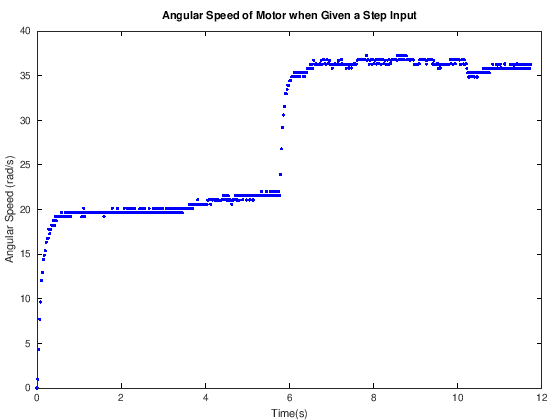

In [19]:
data = load('ExperiementalData.txt'); % lol i spelled that wrong
t = data(:,1);
t0 = t(1);
time = (t-t0).*10^-6;
v0 = data(:,2);
v = data(:,3);
omega = data(:,4);
omega_0 = omega(find(v>2.01,1,'first'));
omega_ss = mean(omega(end-10:end))-omega_0

figure
plot(time,omega,'b.')
xlabel('Time(s)')
ylabel('Angular Speed (rad/s)')
title('Angular Speed of Motor when Given a Step Input')

***In the cell below, explain what order differential equation you would use to model your system and why.***

The system appears to be first order, as the graph rises until it reaches the steady state angular speed. It does not appear to overshoot this value nor oscillate before settling at this steady state angular speed.

# *Model Construction:* Select elements and connect in a system representation

Following the [disciplined process from Week 03 Wednesday](../Week03_Wednesday/Week03_Wednesday.ipynb#Model-Scoping-Disciplined-Process:-Lumped-parameter-Dynamic-Physical-Systems), select elements that represent the physics of the actual motor and construct a system representation (not a linear graph yet, just a schematic showing how the elements are connected).

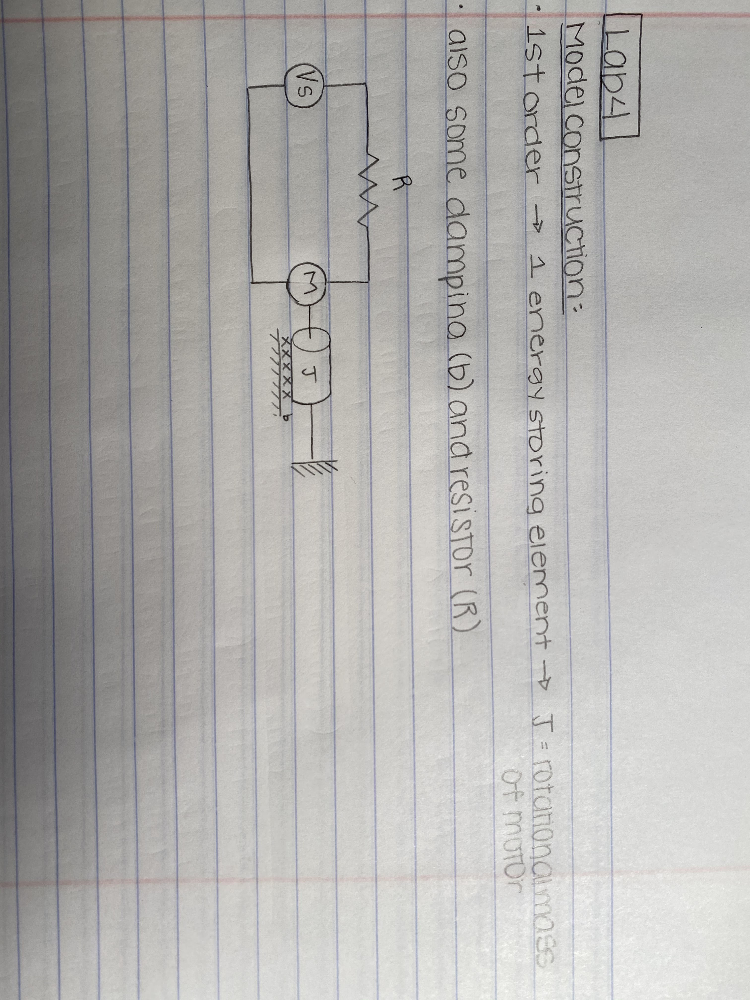

The system is first order and thus there should only be one independent energy storing element. The energy storing element is the rotational mass of the motor. This element was chosen as the only independent energy storing element in the system as the turbine must have rotational inertia in order for us to see an output of the turbine angular speed ($\Omega$).There is also a dissipative element which causes the turbine to approach a steady state. This dissipative element is the damping between the motor and ground. This model must have a dissipative element or else the motor would be able to continuously spin when given a step input, making it a perpetual motion machine which is inherently impossible. There is also a transducer that converts between electrical and rotational mechanical energy. There is also a resistor in the electrical circuit between the source voltage and the voltage supplied to the transducer. A resistor is required because the voltage drop across the transducer is proportional to the output angular velocity of the motor. If there were to be no resistor and a theoretical infinite voltage source, there would be no voltage drop, resulting in an angular velocity of zero and infinite current. If there were an infinite current, the motor torque would subsequently also be infinite, we know this is impossible as there is a maximum stall torque associated with the motor.

# *Model Construction:* Linear Graph and System Equation

In the cell below show your linear graph, differential equation development, and the single equation that describes the angular velocity as a function of time with voltage as an input.

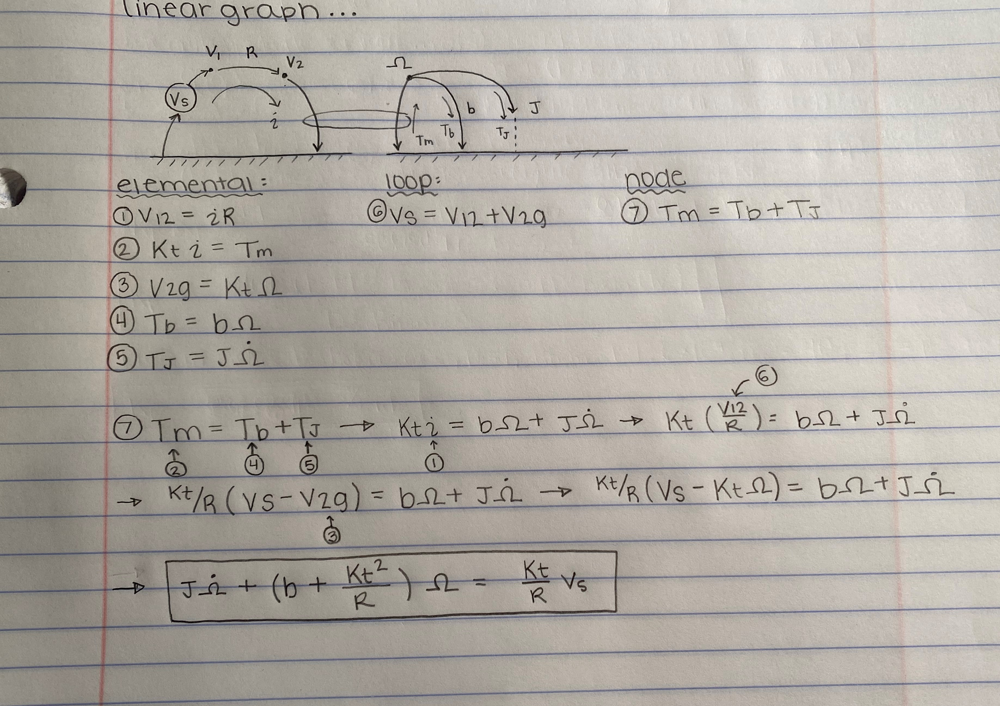

# *Model Construction and Validation:* Parameter Estimation

To complete the model you will need to estimate the value of the constants associated with the lumped parameter models.  Some may be determined from [manufacturer data.](https://www.pololu.com/product/3073/specs)  The remainder will have to be determined by fitting the model to the experimentally measured response of the real system.

Note that by considering the solutions to [1st and 2nd order linear differential equations](../Week03_Monday/Week03_Monday.ipynb/#First-Order-Linear-Differential-Equations) a 1st order response is described by 2 parameters and a 2nd order response is described by 3 parameters.  If you have more parameters than a single response can determine, you will need an additional step response to have enough information to fit the additional parameters.  However, just changing the input is not sufficient.  Consider, for example the steady state gain.  We know that it will be [related to the parameters of a differential equation](../Week03_Monday/Week03_Monday.ipynb/#Steady-State-Gain). 

$$K_{ss} = \frac{\Delta y_{ss}}{\Delta u_{ss}}$$

However, if the input were doubled, the output would be doubled as well (since we are expecting the system to behave linearly) and so no new information is revealed.  Therefore, you will need to change HOW the system responds, not its input.  You can achieve this by changing the system in KNOWN way.  We will accomplish this by using the load inertia that you can attach to the motor shaft, adding a known inertia (calculated using geometry) to the system and allow you to generate a new response and determine the additional parameters.  

If you do fit your model to 2 different responses, it must *simultaneously* fit both responses with both modeling equations to ensure the parameters meet both conditions.

To attach the load inertia, follow the steps you used to [remove the inertia](../Week04_Implementation_Resources/Week04_Hardware_Resource.ipynb#Removing-the-Inertia-Module) in reverse order. Note that you are using the 3D printed flex coupling shown in the images to attach the motor shaft to the load inertia shaft.

Note that you'll need to remove the spring coupler and small shafts already installed in your inertia module and replace them with the long solid shaft supplied in your bag of parts.  The brass load inertia has to fixed to the shaft using the set screw.  Check with your instructor if you have any questions on the assembly and attachment of the load inertia.

***In the cell below, show your calculation of the brass' mass moment of inertia***

density of brass: $\rho = 8730 \frac{kg}{m^3}$

diameter of main brass part: $D = 2" = 0.0508 m$

width of main brass part: $W = \frac{3}{4}" = 0.01905 m$

volume of main brass part: $V_{main} = \frac{\pi}{4}D^2W = \frac{\pi}{4}(0.0508 m)^2(0.01905 m) = 3.86\cdot 10^{-5} m^3$

mass of main brass part: $m_{main} = \rho V_{main} = (8730 \frac{kg}{m^3})(3.86\cdot 10^{-5} m^3) = 0.337 kg$

moment of inertia of main brass part: $I_{main} = \frac{1}{8}m_{main}D^2 = \frac{1}{8}(0.337 kg)(0.0508 m)^2 = 1.09\cdot 10^{-4} kg\cdot m^2$

diameter of shoulder: $d =  \frac{5}{8}" = 0.015875 m$

width of shoulder: $w = \frac{1}{4}" = 0.00635 m$

volume ofshoulder: $V_{shoulder} = \frac{\pi}{4}d^2w = \frac{\pi}{4}(0.015875 m)^2(0.00635 m) = 1.26\cdot 10^{-6} m^3$

mass of shoulder: $m_{shoulder} = \rho V_{shoulder} = (8730 \frac{kg}{m^3})(1.26\cdot 10^{-6} m^3) = 0.0110 kg$

moment of inertia of shoulder: $I_{shoulder} = \frac{1}{8}m_{shoulder}d^2 = \frac{1}{8}(0.0110 kg)(0.015875 m)^2 = 3.46\cdot 10^{-7} kg\cdot m^2$

TOTAL MOMENT OF INERTIA: $I_{total} = I_{main} + I_{shoulder} = 1.09\cdot 10^{-4} kg\cdot m^2 + 3.46\cdot 10^{-7} kg\cdot m^2 = 1.09\cdot 10^{-4} kg\cdot m^2$

***In the cell below, read in your expimental data and fit the parameters of your model to the response(s) you recorded.  On ONE plot, show all responses and model fits on a properly labeled graph.***

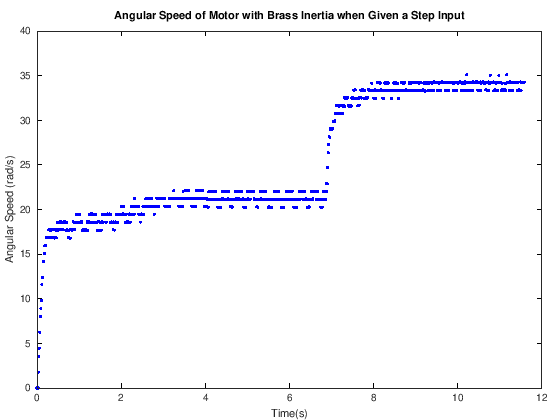

In [26]:
data_weight = load('ExperimentalData_weighted5.txt'); 
t_weight = data_weight(:,1);
t0_weight = t_weight(1);
time_weight = (t_weight-t0_weight).*10^-6;
v0_weight = data_weight(:,2);
v_weight = data_weight(:,3);
omega_weight = data_weight(:,4);

figure
plot(time_weight,omega_weight,'b.')
xlabel('Time(s)')
ylabel('Angular Speed (rad/s)')
title('Angular Speed of Motor with Brass Inertia when Given a Step Input')

In [27]:
omega0_weight = mean(omega_weight(400:500));
omegass_weight = mean(omega_weight(end-100:end));
omegatau_weight = (0.632*(omegass_weight - omega0_weight))+omega0_weight;
t_start = time_weight(find(v_weight>2.51,1,'first'));
tau_weight = time_weight(find(omega_weight<omegatau_weight,1,'last'))-t_start

tau_weight =  0.14283


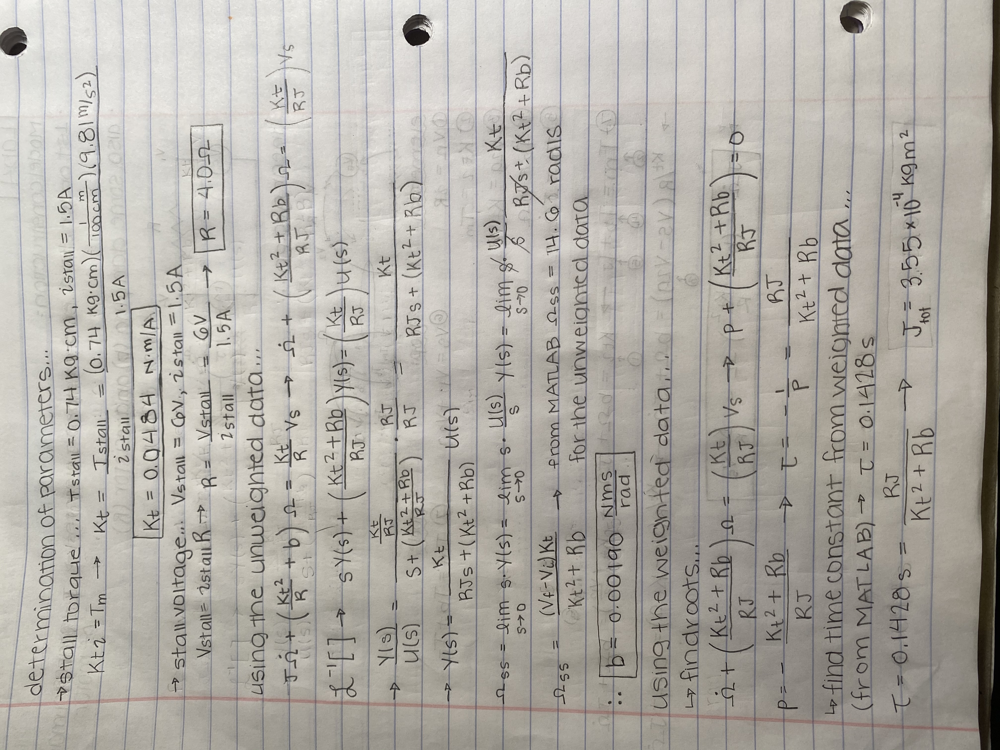

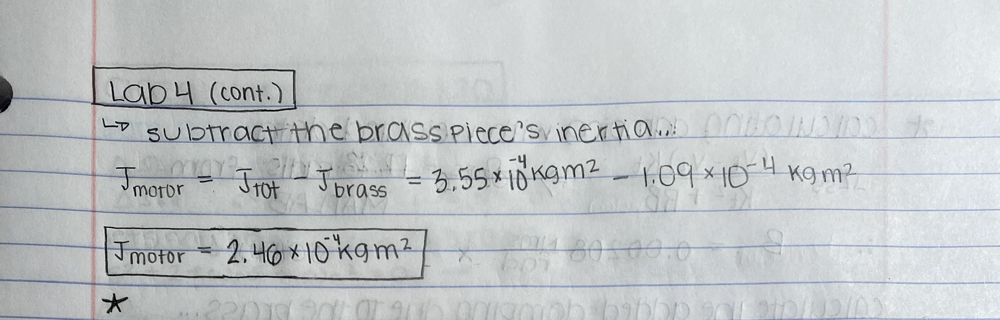

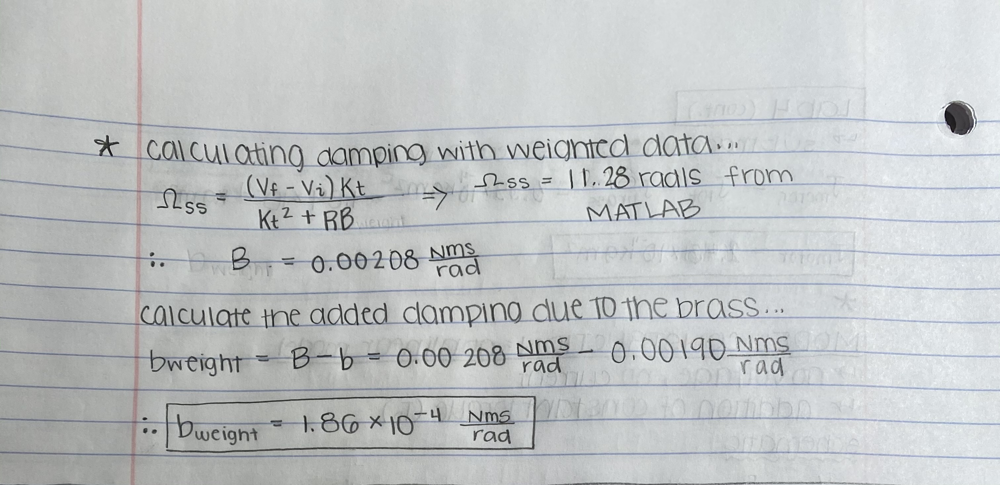

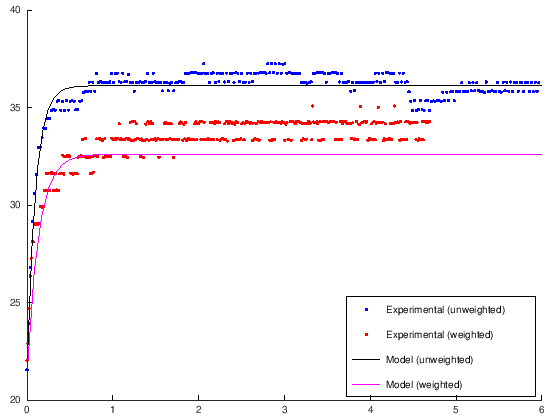

In [30]:
% CHECKING MODEL...
Kt = 0.0484;
R = 4;
b = 0.001898;
b_weight = 1.863E-4;
J_motor = 2.45955E-4;
J_brass = 1.09E-4;
J_tot = J_motor+J_brass;

s = tf('s');
TF_unweight = Kt/((R*J_motor)*s + (Kt^2 + R*b));
[ysim_unweight,tsim_unweight]=step(TF_unweight,6);
y_unweight = (2.99*ysim_unweight)+omega_0;

TF_weight = Kt/((R*J_tot)*s + (Kt^2 + R*(b+b_weight)));
[ysim_weight,tsim_weight]=step(TF_weight,6);
y_weight = (2.49*ysim_weight)+omega0_weight;


figure
hold on
plot(time(265:end)-time(265),omega(265:end),'b.')
plot(time_weight(582:end)-time_weight(582),omega_weight(582:end),'r.')
plot(tsim_unweight,y_unweight,'k')
plot(tsim_weight,y_weight,'m')
legend('Experimental (unweighted)','Experimental (weighted)','Model (unweighted)','Model (weighted)','location','southeast')
hold off

**List the parameters and values you found that complete your model using the table format provided**

| Parameter  Name |  Value  |   Units |   
|------------ ----|---------|---------|
| Param 1         |  value  |  (    ) | 
| Param 2         |  value  |  (    ) | 

|Parameter|Value|Units|
|---|---|---|
|$K_t$|0.0484|$\frac{Nm}{A}$|
|$R$|4.0|$\Omega$|
|$b$|0.00190|$\frac{Nms}{rad}$|
|$J$|$2.46\cdot$$10^{-4}$|$kg$$m^2$|
|$b_{weight}$|$1.86\cdot$$10^{-4}$|$\frac{Nms}{rad}$|

# *Model Validation:* Coast Down

All of the scenarios you have considered for your model involve the motor operating under power.  However, it is relevant to consider how the motor behaves when the power is turned off and it "coasts" to a stop.  This experiment will require a modification to your code.  Add the following functionality:

In RUN mode

* When BTN 2 is held down, the motor relay will be DISCONNECTED and the motor voltage will be set to 0V.  
* When BTN 2 is released the relay will reconnect and the motor voltage will return to the initial voltage.

***Capture a cost down with the the load inertia attached and the motor initial voltage set to 5V.  Plot the motor angular velocity vs time in the cell below***

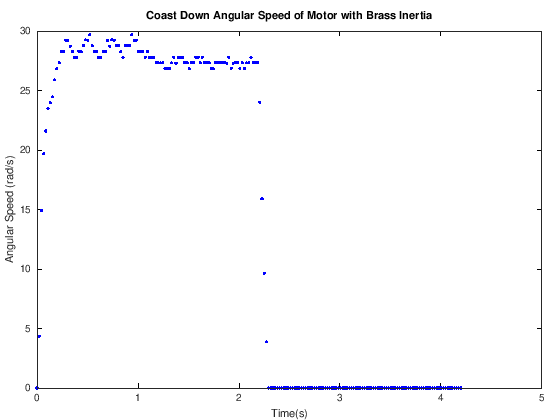

In [31]:
data_coast = load('ExperimentalData_coastdown.txt');
t_coast = data_coast(:,1);
t0_coast = t_coast(1);
time_coast = (t_coast-t0_coast).*10^-6;
omega_coast = data_coast(:,4);
v_coast = data_coast(:,3);
omega0_coast = mean(omega_coast(15:100));

figure
plot(time_coast,omega_coast,'b.')
xlabel('Time(s)')
ylabel('Angular Speed (rad/s)')
title('Coast Down Angular Speed of Motor with Brass Inertia')

You should notice the plot does NOT look like the linear responses we are familiar with for 1st and 2nd order models.  The behavior is nonlinear.  So what is the source?  "sliding" or "dry" friction.  This is the physical phenomenon you might remember from physics or dynamics where the friction force of a sliding object is dependent on the speed.

The same friction applies to rotating systems.  The plot below suggests that the actual behavior of the torque resulting from the friction, $T_F$, is fairly complicated.  However, a simplified model for the friction that is shown is called the Coulomb friction model.  Here the friction is modeled with 2 values.  When the angular velocity is 0, there is a static frictional torque that reaches a maximum value of $T_S$ just before it begins to move and then the frictional torque is modeled as a constant dynamic value $T_D$.

The response you are observing is that when the system's angular velocity becomes very small, the friction torque INCREASES and thus changes the dynamic response.



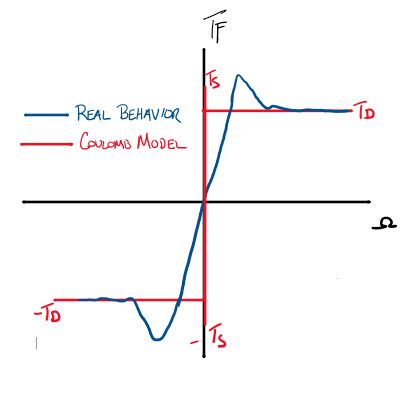

To incorporate this non-linear effect into a model, we'll consider ONLY the part of the system response when the shaft is rotating.  We won't try to model the change in the friction torque, we'll just try to model the region where the friction torque is constant.  This will STILL leave us with a nonlinear term in our system model (a constant in the differential equation that is not the input means the system equation does not match the form of a linear 1st of 2nd order differential equation).  So we'll need to linearize!

# Model Construction: Nonlinear model

Considering a motor model with *NO voltage or current input* and the addition of a constant Torque $T_D$ as a result of dynamic friction, construct a schematic, linear graph, and derive the differential equation that describes the behavior.  Include your development in the cell below.  

As a technique to linearize the equation, you can cast your differential equation so the constant "appears" as an input.  Although the torque due to the friction could never "drive" the system, it can only dissipate energy, mathematically this "rearrangement" will allow you to account for the nonlinear term using the same solution methods you would use for truly linear systems.


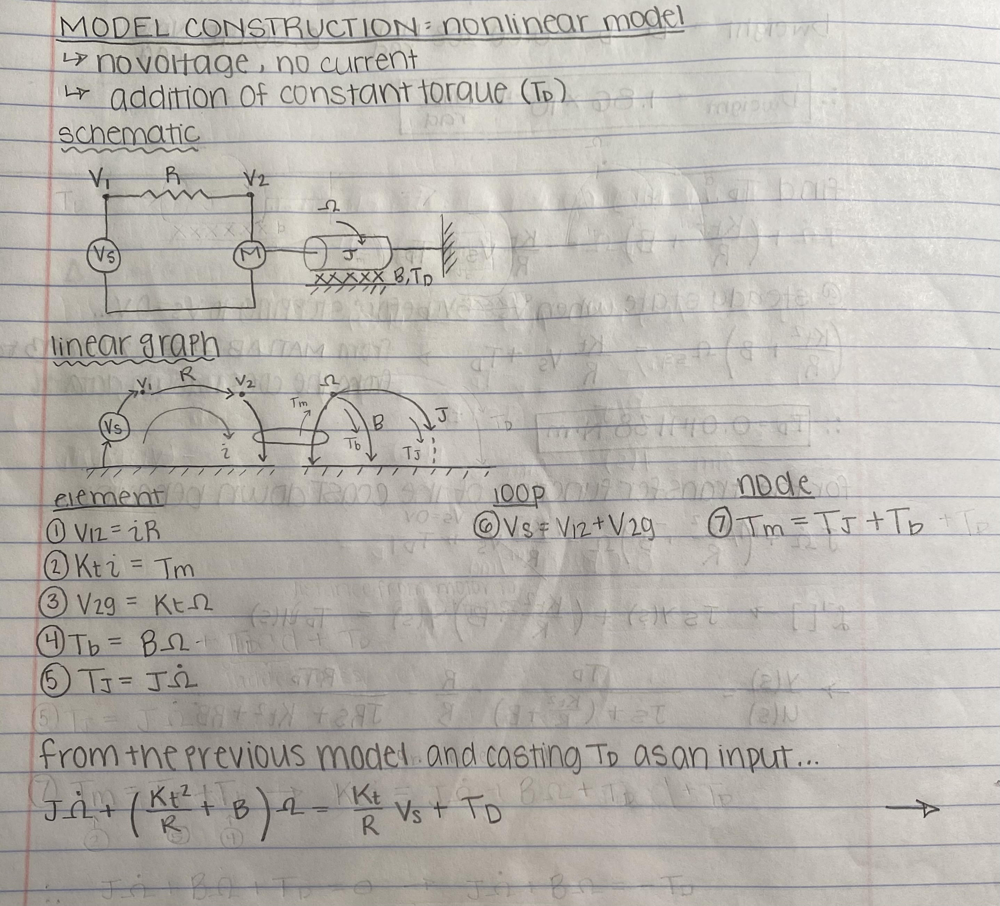

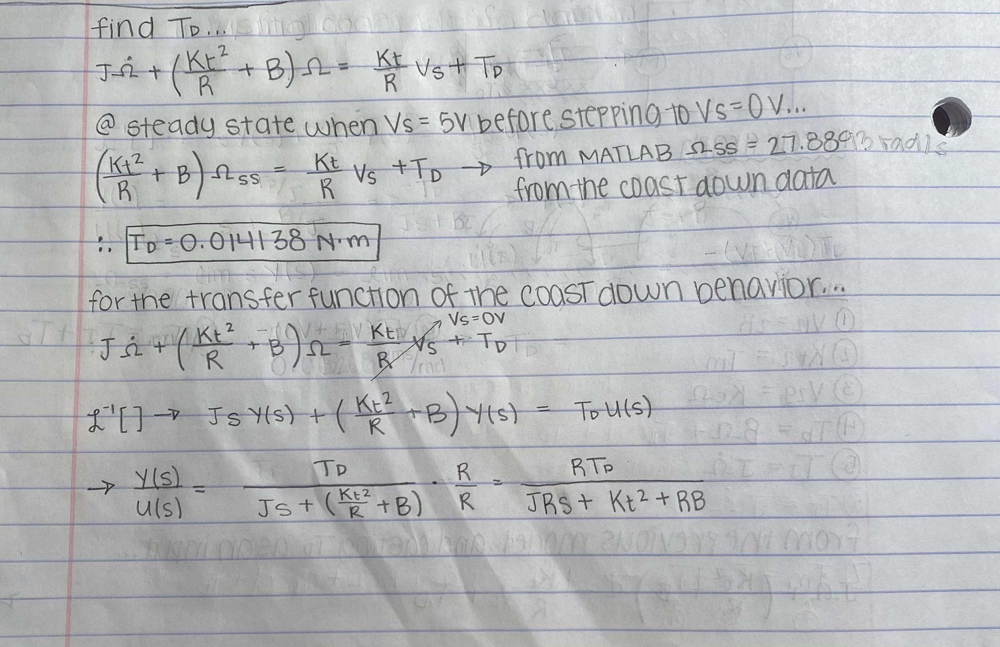

Using the previously identified parameter values for the motor elements, fit your "coast down" linearized model to the data you aquired in order to estimate a value of $T_D$.  Remember, the model is only valid where the friction torque is constant, which means it will only fit the model where the velocity is non-zero! Show the fit of the model and the recorded response on the same plot.  Label axis and include units.

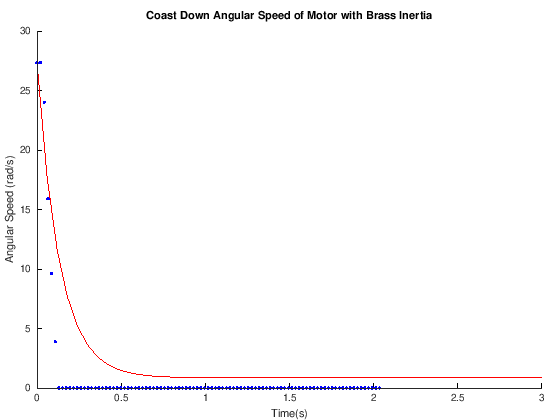

In [36]:
Td = 0.014138;

TF_coast = (Td*R)/((R*J_tot)*s + (Kt^2 + R*(b+b_weight)));
[ysim_coast,tsim_coast]=step(TF_coast,3);
y_coast = (-5*ysim_coast)+omega_coast(100);


figure
hold on
plot(tsim_coast,y_coast,'r')
plot(time_coast(100:end)-time_coast(100),omega_coast(100:end),'b.')
xlabel('Time(s)')
ylabel('Angular Speed (rad/s)')
title('Coast Down Angular Speed of Motor with Brass Inertia')
hold off

Enter the value of your estimated $T_D$ below with appropriate units

$T_D = 0.014138 N\cdot m$